In [32]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [33]:
from dust3r.inference import inference
from dust3r.model import AsymmetricCroCo3DStereo
from dust3r.utils.image import load_images
from dust3r.image_pairs import make_pairs
from dust3r.cloud_opt import global_aligner, GlobalAlignerMode
from dust3r.datasets.freiburgDataset import freiburgDataset 
import tqdm
import matplotlib.pyplot as plt
import numpy as np 
from test_utilis import *
import torchvision.transforms as T
from PIL import Image
import torch


## Quantative and Qualitative Analysis

## Freiburg Thermal Dataset

### RANSAC 

... loading model from /home/user/elwakeely1/dust3r/checkpoints/dust3r_demo_1_RansacV2/checkpoint-best.pth
instantiating : AsymmetricCroCo3DStereo(pos_embed='RoPE100', img_size=(224, 224), head_type='linear', output_mode='pts3d', depth_mode=('exp', -inf, inf), conf_mode=('exp', 1, inf), enc_embed_dim=1024, enc_depth=24, enc_num_heads=16, dec_embed_dim=768, dec_depth=12, dec_num_heads=12, landscape_only=False)
<All keys matched successfully>


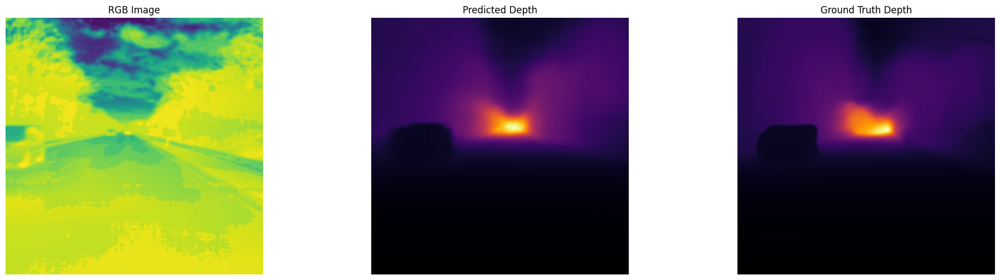

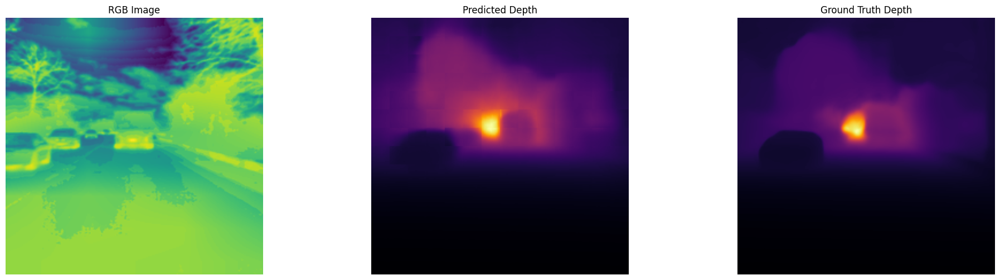

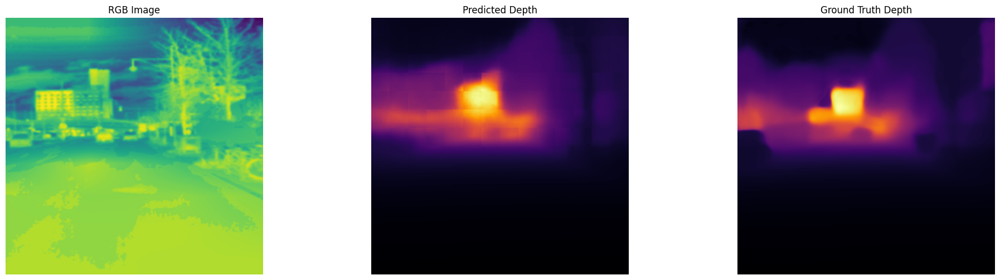

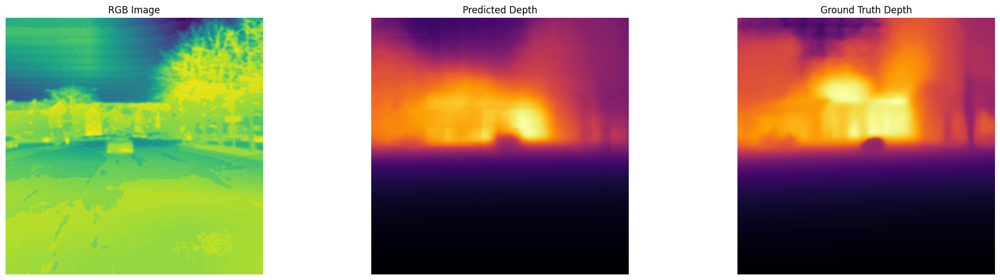

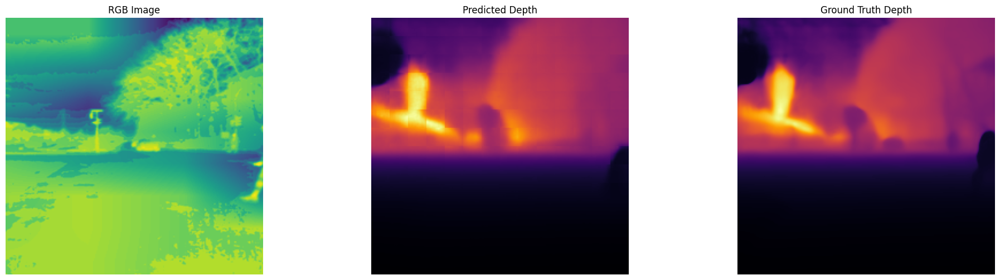

RMSE Loss: 0.1601
Accuracy < 1.25: 0.2405
Accuracy < 1.25^2: 0.6071


In [34]:

test_dataset =freiburgDataset(ROOT='/home/user/elwakeely1/DataParam', split='Test', resolution=224, aug_crop=16,method = 'RANSAC')

model = AsymmetricCroCo3DStereo.from_pretrained("/home/user/elwakeely1/dust3r/checkpoints/dust3r_demo_1_RansacV2/checkpoint-best.pth", strict=False)
accuracy_list = test_model(model,test_dataset)
average_metrics(accuracy_list)


### PNP_RANSAC

In [ ]:

test_dataset =freiburgDataset(ROOT='/home/user/elwakeely1/DataParam', split='Test', resolution=224, aug_crop=16,method = 'RANSAC')

model = AsymmetricCroCo3DStereo.from_pretrained("/home/user/elwakeely1/dust3r/checkpoints/dust3r_demo_1_RansacV2/checkpoint-best.pth", strict=False)
accuracy_list = test_model(model,test_dataset)
average_metrics(accuracy_list)

### Procrustes 

... loading model from /home/user/elwakeely1/dust3r/checkpoints/dust3r_demo_1_procrustes /checkpoint-best.pth
instantiating : AsymmetricCroCo3DStereo(pos_embed='RoPE100', img_size=(224, 224), head_type='linear', output_mode='pts3d', depth_mode=('exp', -inf, inf), conf_mode=('exp', 1, inf), enc_embed_dim=1024, enc_depth=24, enc_num_heads=16, dec_embed_dim=768, dec_depth=12, dec_num_heads=12, landscape_only=False)
<All keys matched successfully>


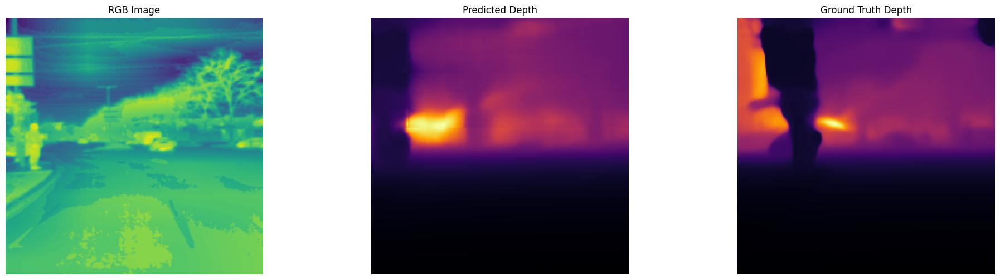

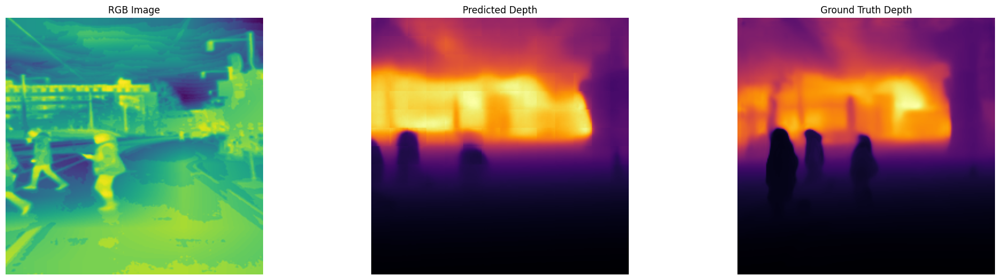

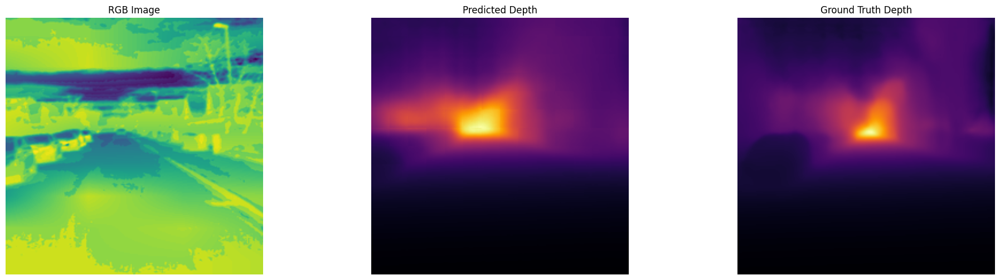

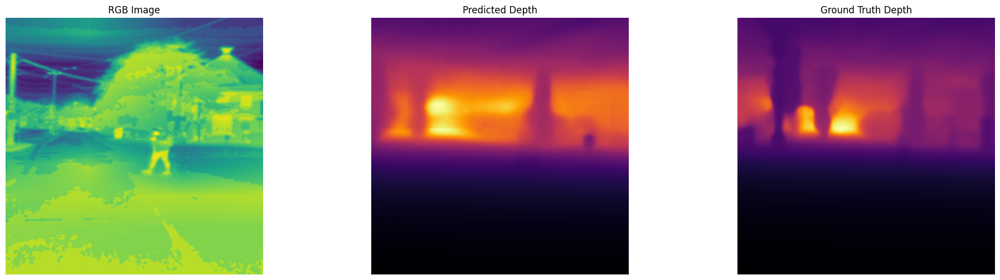

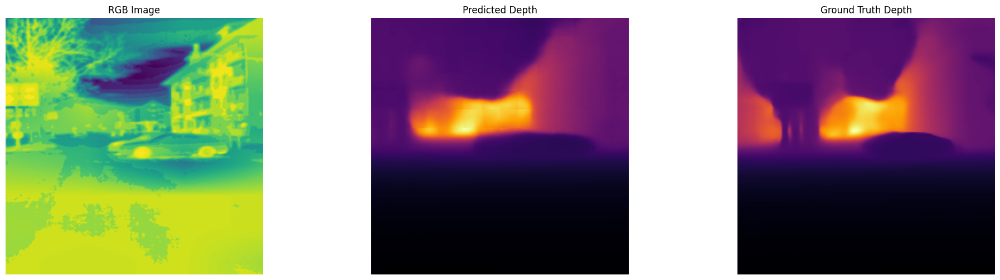

RMSE Loss: 0.2453
Accuracy < 1.25: 0.0908
Accuracy < 1.25^2: 0.2496


In [29]:

# test_dataset =freiburgDataset(ROOT='/home/user/elwakeely1/DataParam', split='Test', resolution=224, aug_crop=16,method = 'RANSAC')
model = AsymmetricCroCo3DStereo.from_pretrained("/home/user/elwakeely1/dust3r/checkpoints/dust3r_demo_1_procrustes /checkpoint-best.pth", strict=False)
accuracy_list = test_model(model,test_dataset)
average_metrics(accuracy_list)

### RANSAC with color jitter 

... loading model from /home/user/elwakeely1/dust3r/checkpoints/dust3r_demo_2/checkpoint-best.pth
instantiating : AsymmetricCroCo3DStereo(pos_embed='RoPE100', img_size=(224, 224), head_type='linear', output_mode='pts3d', depth_mode=('exp', -inf, inf), conf_mode=('exp', 1, inf), enc_embed_dim=1024, enc_depth=24, enc_num_heads=16, dec_embed_dim=768, dec_depth=12, dec_num_heads=12, landscape_only=False)
<All keys matched successfully>


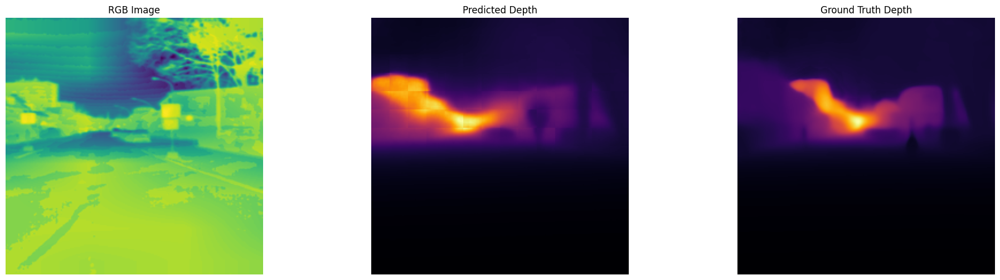

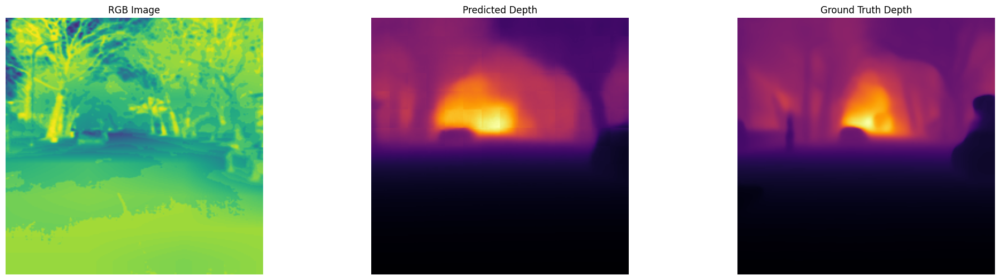

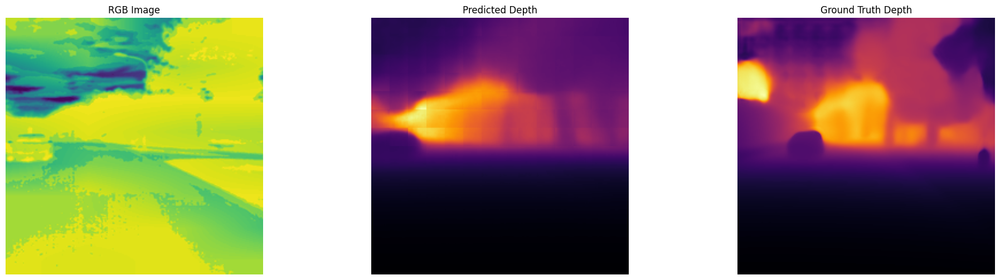

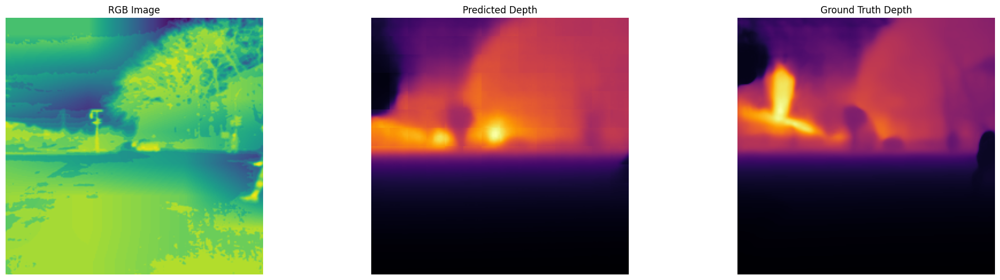

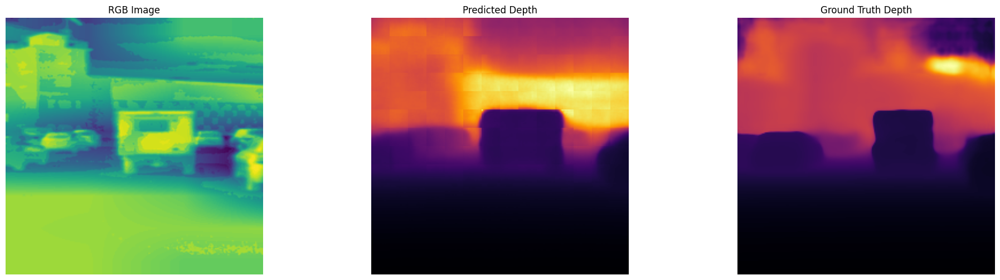

RMSE Loss: 0.2617
Accuracy < 1.25: 0.2172
Accuracy < 1.25^2: 0.5529


In [ ]:

test_dataset =freiburgDataset(ROOT='/home/user/elwakeely1/DataParam', split='Test', resolution=224, aug_crop=16)

model = AsymmetricCroCo3DStereo.from_pretrained("/home/user/elwakeely1/dust3r/checkpoints/dust3r_demo_2/checkpoint-best.pth", strict=False)
accuracy_list = test_model(model,test_dataset)
average_metrics(accuracy_list)

### dust3r base code 

... loading model from /home/user/elwakeely1/dust3r/checkpoints/DUSt3R_ViTLarge_BaseDecoder_224_linear.pth
instantiating : AsymmetricCroCo3DStereo(enc_depth=24, dec_depth=12, enc_embed_dim=1024, dec_embed_dim=768, enc_num_heads=16, dec_num_heads=12, pos_embed='RoPE100', img_size=(224, 224), head_type='linear', output_mode='pts3d', depth_mode=('exp', -inf, inf), conf_mode=('exp', 1, inf), landscape_only=False)
<All keys matched successfully>


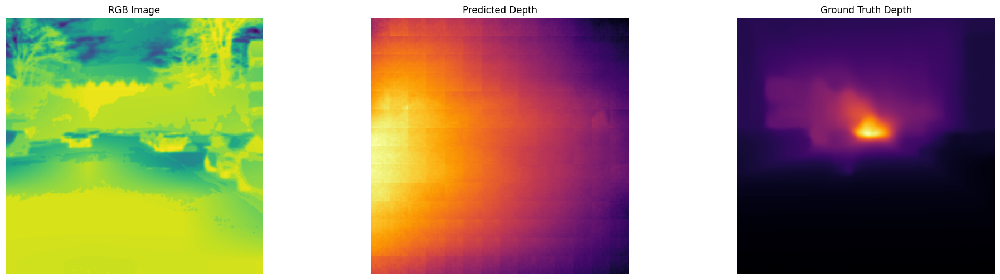

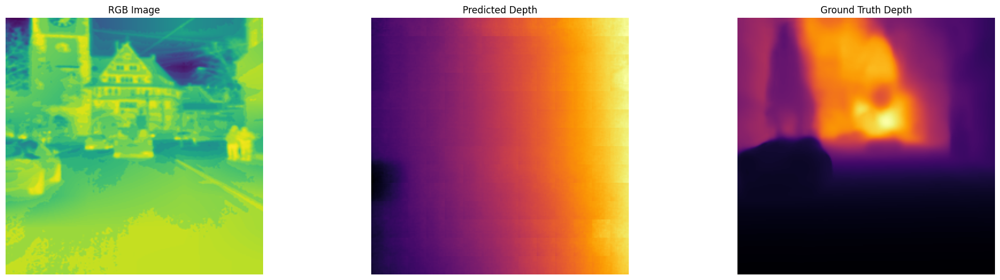

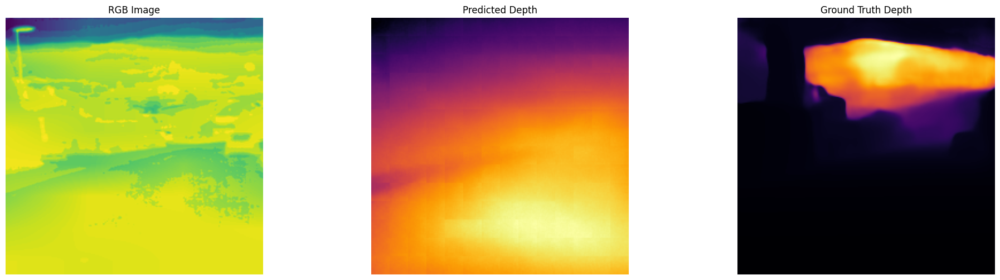

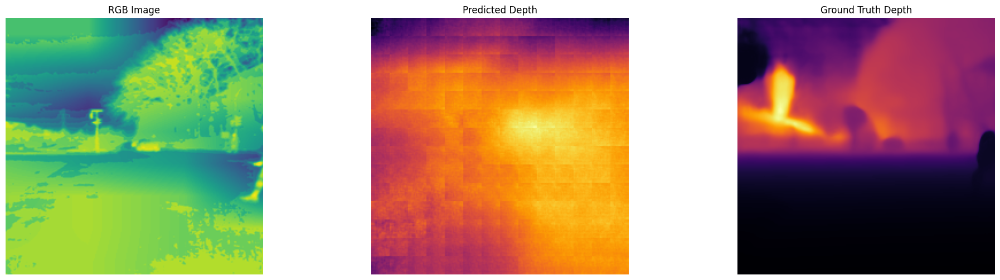

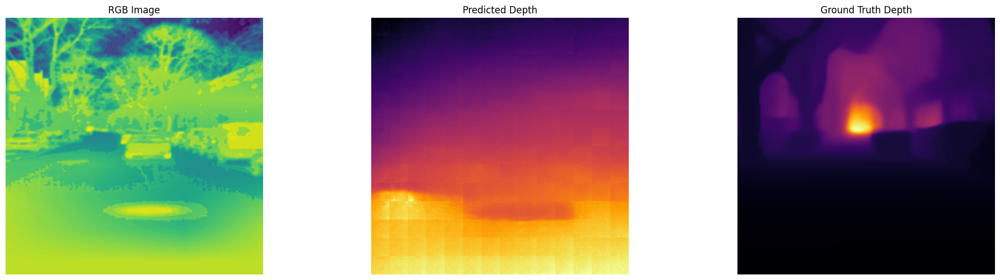

RMSE Loss: 0.8192
Accuracy < 1.25: 0.1408
Accuracy < 1.25^2: 0.2466


In [38]:
test_dataset =freiburgDataset(ROOT='/home/user/elwakeely1/DataParam', split='Test', resolution=224, aug_crop=16,method = None)

model = AsymmetricCroCo3DStereo.from_pretrained("/home/user/elwakeely1/dust3r/checkpoints/DUSt3R_ViTLarge_BaseDecoder_224_linear.pth", strict=False)
accuracy_list = test_model(model,test_dataset)
average_metrics(accuracy_list)

## AIS Dataset

... loading model from /home/user/elwakeely1/dust3r/checkpoints/dust3r_demo_1_RansacV2/checkpoint-best.pth
instantiating : AsymmetricCroCo3DStereo(pos_embed='RoPE100', img_size=(224, 224), head_type='linear', output_mode='pts3d', depth_mode=('exp', -inf, inf), conf_mode=('exp', 1, inf), enc_embed_dim=1024, enc_depth=24, enc_num_heads=16, dec_embed_dim=768, dec_depth=12, dec_num_heads=12, landscape_only=False)
<All keys matched successfully>


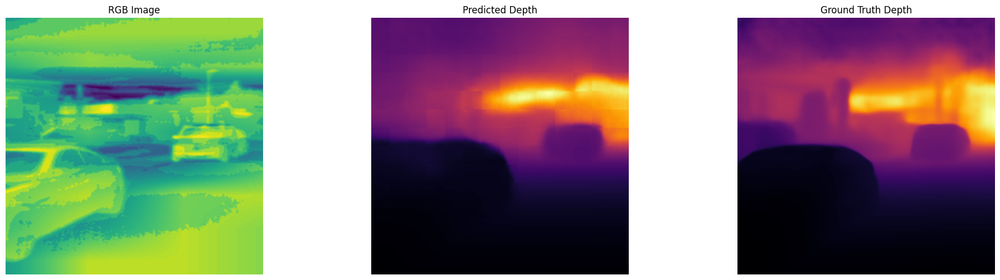

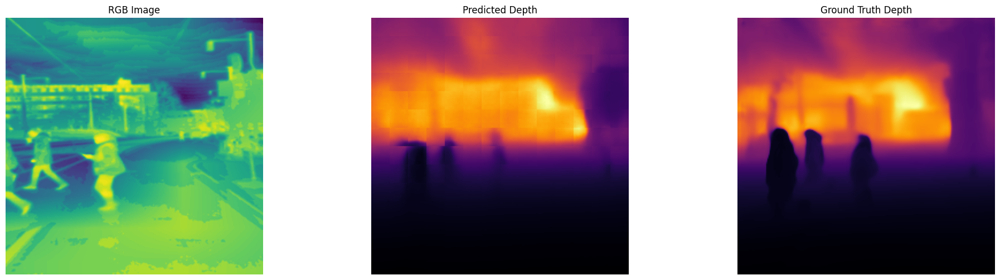

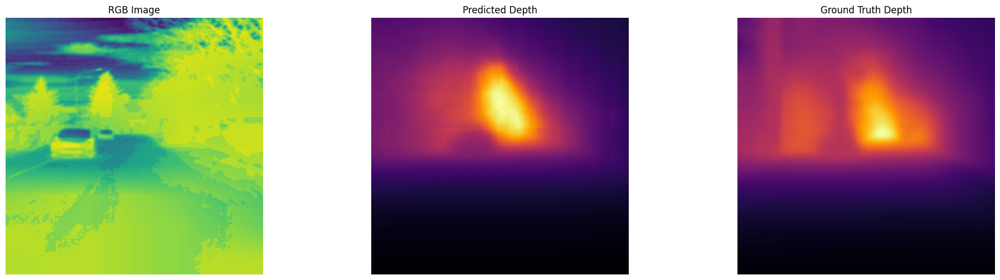

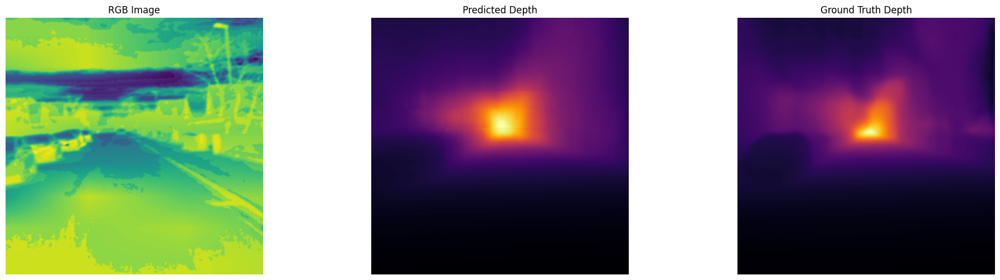

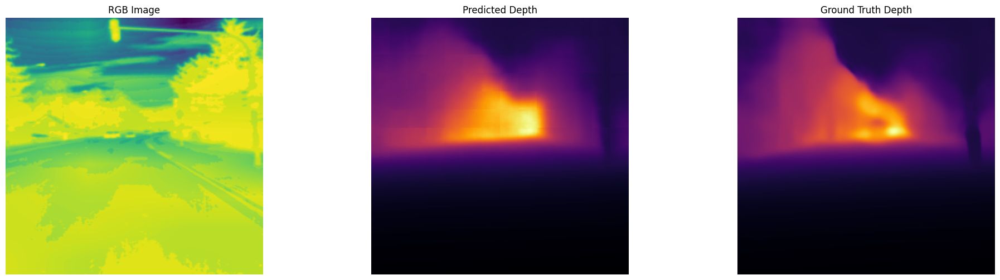

KeyboardInterrupt: 

In [40]:
from dust3r.datasets.AISdataset import AISDataset

ais_data = AISDataset(ROOT="/home/user/zafara1/ThermalImages/test_data",method="Procrustes", split = "Train",resolution=224, aug_crop=16)
model = AsymmetricCroCo3DStereo.from_pretrained("/home/user/elwakeely1/dust3r/checkpoints/dust3r_demo_1_RansacV2/checkpoint-best.pth", strict=False)
accuracy_list = test_model(model,ais_data)
average_metrics(accuracy_list)

    
